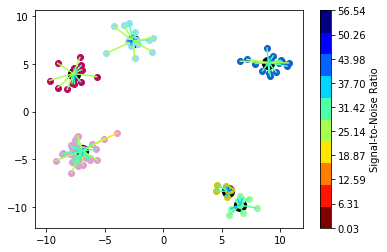

0.7301032543182373
{'Cluster Head': 'client51', 'Members': ['client6', 'client15', 'client49', 'client75', 'client76', 'client84'], 'SNR': [26.82784721472273, 41.027736016964674, 26.517322885456036, 35.420994380977355, 38.62652812423833, 32.956800428969835], 'CSI': [0.18805579178120402, 0.531866536124605, 0.25210760999694903, 0.056072858539646164, 0.6310500080849365, 0.3414647982289387]}


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
from utils import averageModelscluster
import random
import math
import matplotlib.pyplot as plt
from ipynb.fs.full.K_clusters import cluster_former
from copy import deepcopy

In [2]:
P=2 #signal power threshold
#stream = BitStream()
#random.seed(10)
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 50
        self.rounds = 200
        self.epochs = 3
        self.local_batches = 64
        self.lr = 0.01
        self.C = 1 #fraction of clients used in the round
        self.drop_rate = 0 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.numclusters=4

args = Arguments()

In [4]:
#checking if gpu is available
#use_cuda = args.use_cuda and torch.cuda.is_available()
use_cuda=False
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
me = hook.local_worker
clients = []

#generating virtual clients
for i in range(args.clients):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
#print(clients)

In [5]:
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average


/home/test/anaconda3/lib/python3.7/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [6]:
#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [7]:
"""class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50) #10 iid #50 non iid
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10
                   )
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1) """

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)

In [8]:
def fedprox(params,global_params):
    global_param=[]
    ind=0
    for gp in global_params:
        global_param.append(gp)
    for p in params:
    #                 print(p.grad)
        lr=0.001
        mu=0.1
        if(p.grad is None):
            continue
        grad=p.grad.data #batch gradients
        p.data.sub_(lr,(grad+mu*(p.data.clone()-global_param[ind].data.clone())))
        ind+=1
#     return(p)

In [9]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu,head):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    head['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    diff=[]
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                #client['optim'].zero_grad()
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                #client['optim'].step()
                params=client['model'].parameters()
                gp=head['model'].parameters()
                global_param=[]
                
                ind=0
                for gp1 in gp:
                    global_param.append(gp1)
                for p in params:
                    diff.append(p.data.clone()-global_param[ind].data.clone())
                    ind+=1
                params=fedprox(params,gp) 
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get()
    head['model'].get()
    # print()
         #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print(diff)
    print()
    return gc

In [10]:
def test(args, model, device, test_loader, name,fed_round):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda and fed_round==0):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return([100. * correct / len(test_loader.dataset),test_loss])

In [11]:
torch.manual_seed(args.torch_seed)

In [12]:
def distort(neighbours,snrs):
    ind=0
    poptim=2
    csi=random.random()
    distorted_models=[]
    for client in neighbours:
        snr=snrs[ind]
        ind+=1
        snr__=10**(snr/10)
        absh=csi*poptim/snr__
        x=random.uniform(0,absh)
        y=math.sqrt(absh*absh-x*x)
        std=math.sqrt(poptim/snr__*absh*absh) #channel noise
        h=complex(x,y)
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
        
        distorted_models.append(client)
    return(distorted_models)
        

In [13]:
def decentralized(clients,snrs,weights):
    big_daddy_of_distorted_models=[]
    for client in clients:
        distorted_models=[]
        snr_list=[]
        for snr in snrs:
            if(client['hook'].id in snr):
                snr_list.append(snr[2])
        neighbours_c = [x for x in clients if x != client]
        neighbours={}
        jjj=[jkl for jkl in range(len(neighbours_c))]
        
        dictionary = dict(zip(jjj, neighbours_c))
        #for jjj in range(len(neighbours_c)):
        #   neighbours[jjj].append(neighbours_c[jjj])
        distorted_models=distort(neighbours,snr_list)
        distorted_models.append(client)
        big_daddy_of_distorted_models.append(distorted_models)
    
    
    weight_final1=[]
    for oho in big_daddy_of_distorted_models:
        weight_final=[]
        for comeon in oho:
            for w in weights:
                if(comeon['hook'].id==w[0]):
                    weight_final.append(w[1])
        weight_final1.append(weight_final)
    
    final_heads=[]
    nets=[]
    ind=0
    for client in clients:
        for oof in big_daddy_of_distorted_models:
            if(client==oof[0]):
#                 print(client)
#                 print("shut up")
#                 print(distorted_models)
#                 print("shut up")
#                 print(weight_final1)
                
                overall=Net()
                overall=averageModelscluster(overall,distorted_models,weight_final1[ind])
                client['model'].load_state_dict(overall.state_dict())
                ind+=1
                final_heads.append(client)
                nets.append(overall)
    
    return(final_heads,nets)
        
            
            

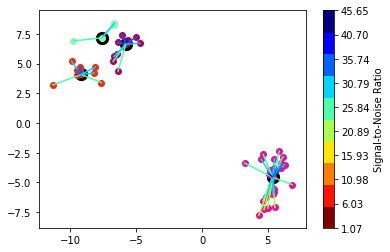

0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.375610


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.414907
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.417313
[(Wrapper)>[PointerTensor | me:71103942710 -> client1:24288957835], (Wrapper)>[PointerTensor | me:96634813165 -> client1:94147219827], (Wrapper)>[PointerTensor | me:8256183630 -> client1:88541451362], (Wrapper)>[PointerTensor | me:49785323335 -> client1:27440110143], (Wrapper)>[PointerTensor | me:42478247628 -> client1:2782915782], (Wrapper)>[PointerTensor | me:79496500833 -> client1:21691109750], (Wrapper)>[PointerTensor | me:7774824098 -> client1:26678158914], (Wrapper)>[PointerTensor | me:66859561687 -> client1:18016496391], (Wrapper)>[PointerTensor | me:86772762163 -> client1:64496262421], (Wrapper)>[PointerTensor | me:56040498104 -> client1:69861603513], (Wrapper)>[PointerTensor | me:94270562200 -> client1:6518830925], (Wrapper)>[PointerTensor | me:3845572502 -> client1:85685206530], (Wrapper)>[PointerTensor | me:55641085581 -> client1:19085435221], (Wrapper)>[Pointe

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.365961
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.352475
[(Wrapper)>[PointerTensor | me:28083679527 -> client10:28187478159], (Wrapper)>[PointerTensor | me:50611293157 -> client10:15708741927], (Wrapper)>[PointerTensor | me:55683143216 -> client10:61595089565], (Wrapper)>[PointerTensor | me:55525511129 -> client10:46542707378], (Wrapper)>[PointerTensor | me:73762698072 -> client10:70438194945], (Wrapper)>[PointerTensor | me:65966338715 -> client10:83855756974], (Wrapper)>[PointerTensor | me:70369308462 -> client10:4960350638], (Wrapper)>[PointerTensor | me:88946684290 -> client10:25652006560], (Wrapper)>[PointerTensor | me:462776898 -> client10:98314523774], (Wrapper)>[PointerTensor | me:77572985737 -> client10:37394270006], (Wrapper)>[PointerTensor | me:31013088590 -> client10:14829117102], (Wrapper)>[PointerTensor | me:43317843578 -> client10:8471917151], (Wrapper)>[PointerTensor | me:39688762195 -> client10:72067458724], (

Exception ignored in: <function ObjectPointer.__del__ at 0x7f33192a78c0>
Traceback (most recent call last):
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/generic/pointers/object_pointer.py", line 345, in __del__
    self.owner.garbage(self.id_at_location, self.location)
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/workers/base.py", line 480, in garbage
    self.send_msg(ForceObjectDeleteMessage(trash[location.id][1]), location)
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/workers/base.py", line 316, in send_msg
    bin_response = self._send_msg(bin_message, location)
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/workers/virtual.py", line 12, in _send_msg
    return location._recv_msg(message)
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/workers/virtual.py", line 22, in _recv_msg
    return self.recv_msg(message)
  File "/home/test/anaconda3/lib/python3.7/site-packages/syft/workers/base.py", line 338, in 

Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.247297
Model client13 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.270043
[(Wrapper)>[PointerTensor | me:57573087120 -> client13:14776057777], (Wrapper)>[PointerTensor | me:83466868657 -> client13:91027748344], (Wrapper)>[PointerTensor | me:41292379989 -> client13:79507894761], (Wrapper)>[PointerTensor | me:27123473465 -> client13:45277652086], (Wrapper)>[PointerTensor | me:17163929682 -> client13:83515750144], (Wrapper)>[PointerTensor | me:2726793600 -> client13:70563679477], (Wrapper)>[PointerTensor | me:44266909541 -> client13:34447226474], (Wrapper)>[PointerTensor | me:97821487249 -> client13:34209258634], (Wrapper)>[PointerTensor | me:99641121876 -> client13:93020953559], (Wrapper)>[PointerTensor | me:6426570803 -> client13:55788466710], (Wrapper)>[PointerTensor | me:17014740882 -> client13:96856434367], (Wrapper)>[PointerTensor | me:99811216377 -> client13:73632775484], (Wrapper)>[PointerTensor | me:75520524930 -> client13:53887856443],

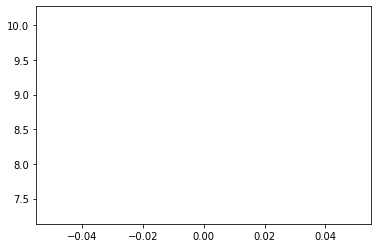

ROUND 0
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.328053


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.328427
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.327104
[(Wrapper)>[PointerTensor | me:35909244286 -> client1:34613358557], (Wrapper)>[PointerTensor | me:12883577086 -> client1:91329797080], (Wrapper)>[PointerTensor | me:55450233464 -> client1:2347137844], (Wrapper)>[PointerTensor | me:7014561123 -> client1:51305808075], (Wrapper)>[PointerTensor | me:41131858980 -> client1:18972560123], (Wrapper)>[PointerTensor | me:64413307571 -> client1:28860361909], (Wrapper)>[PointerTensor | me:21455777960 -> client1:14322250827], (Wrapper)>[PointerTensor | me:62601325522 -> client1:79139172448], (Wrapper)>[PointerTensor | me:7547073395 -> client1:86045758360], (Wrapper)>[PointerTensor | me:99808110020 -> client1:37840266719], (Wrapper)>[PointerTensor | me:43980826055 -> client1:97672246888], (Wrapper)>[PointerTensor | me:74618759938 -> client1:78277939681], (Wrapper)>[PointerTensor | me:53246591595 -> client1:78604177342], (Wrapper)>[Poin

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.304753
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.299917
[(Wrapper)>[PointerTensor | me:54245829133 -> client10:31566999285], (Wrapper)>[PointerTensor | me:53120059657 -> client10:11439555391], (Wrapper)>[PointerTensor | me:91410434153 -> client10:81216581051], (Wrapper)>[PointerTensor | me:90173249378 -> client10:1036032606], (Wrapper)>[PointerTensor | me:94311644942 -> client10:66568446823], (Wrapper)>[PointerTensor | me:28849805744 -> client10:69236897064], (Wrapper)>[PointerTensor | me:86423312579 -> client10:32346158813], (Wrapper)>[PointerTensor | me:72926442100 -> client10:2588417928], (Wrapper)>[PointerTensor | me:4744393016 -> client10:60032760173], (Wrapper)>[PointerTensor | me:63306702187 -> client10:95698941648], (Wrapper)>[PointerTensor | me:12806849747 -> client10:58266330079], (Wrapper)>[PointerTensor | me:78528179814 -> client10:37831592380], (Wrapper)>[PointerTensor | me:58253811604 -> client10:76408511168], 

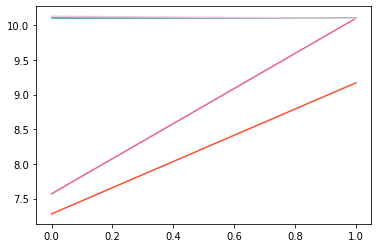

ROUND 1
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.307730


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.306783
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.306787
[(Wrapper)>[PointerTensor | me:92816714404 -> client1:42480121962], (Wrapper)>[PointerTensor | me:29785631448 -> client1:92626137358], (Wrapper)>[PointerTensor | me:45291163808 -> client1:4568564683], (Wrapper)>[PointerTensor | me:82569159502 -> client1:89653697799], (Wrapper)>[PointerTensor | me:27660374488 -> client1:7462872630], (Wrapper)>[PointerTensor | me:72327359531 -> client1:38227667645], (Wrapper)>[PointerTensor | me:76823529056 -> client1:73204919927], (Wrapper)>[PointerTensor | me:57472093792 -> client1:64834338172], (Wrapper)>[PointerTensor | me:22274468960 -> client1:81751509117], (Wrapper)>[PointerTensor | me:28399789361 -> client1:32356408360], (Wrapper)>[PointerTensor | me:36930019036 -> client1:36597728932], (Wrapper)>[PointerTensor | me:88475505961 -> client1:98100374081], (Wrapper)>[PointerTensor | me:36881927067 -> client1:35417469839], (Wrapper)>[Poi

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302575
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302959
[(Wrapper)>[PointerTensor | me:33943528196 -> client10:50879323780], (Wrapper)>[PointerTensor | me:14880855601 -> client10:61616868141], (Wrapper)>[PointerTensor | me:24041664516 -> client10:37566376174], (Wrapper)>[PointerTensor | me:49096839344 -> client10:87655333903], (Wrapper)>[PointerTensor | me:94588768275 -> client10:97537190313], (Wrapper)>[PointerTensor | me:30505884868 -> client10:16908100427], (Wrapper)>[PointerTensor | me:67318575604 -> client10:3985927632], (Wrapper)>[PointerTensor | me:57565558167 -> client10:8453817704], (Wrapper)>[PointerTensor | me:50676923579 -> client10:85449284032], (Wrapper)>[PointerTensor | me:32116375104 -> client10:89135879551], (Wrapper)>[PointerTensor | me:41301060998 -> client10:24159741633], (Wrapper)>[PointerTensor | me:2481946290 -> client10:16504886652], (Wrapper)>[PointerTensor | me:82326111078 -> client10:36377541550], 

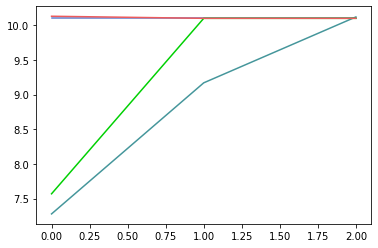

ROUND 2
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303408


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.303432
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.303276
[(Wrapper)>[PointerTensor | me:78157440100 -> client1:8594857371], (Wrapper)>[PointerTensor | me:26963349460 -> client1:47232970416], (Wrapper)>[PointerTensor | me:40261639383 -> client1:7251960485], (Wrapper)>[PointerTensor | me:38432452187 -> client1:2997473516], (Wrapper)>[PointerTensor | me:91803472125 -> client1:86014116461], (Wrapper)>[PointerTensor | me:55740327481 -> client1:83266488569], (Wrapper)>[PointerTensor | me:86050401318 -> client1:18983717131], (Wrapper)>[PointerTensor | me:8748254625 -> client1:33036512216], (Wrapper)>[PointerTensor | me:77255109304 -> client1:10534669756], (Wrapper)>[PointerTensor | me:9091250915 -> client1:35672404342], (Wrapper)>[PointerTensor | me:2757750084 -> client1:54237292793], (Wrapper)>[PointerTensor | me:95026255986 -> client1:4898568471], (Wrapper)>[PointerTensor | me:67746047694 -> client1:85633188127], (Wrapper)>[PointerT

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302444
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302592
[(Wrapper)>[PointerTensor | me:10687297694 -> client10:69106064757], (Wrapper)>[PointerTensor | me:28753860371 -> client10:62580520311], (Wrapper)>[PointerTensor | me:78371053409 -> client10:98998838916], (Wrapper)>[PointerTensor | me:58565585985 -> client10:43463966680], (Wrapper)>[PointerTensor | me:44241606406 -> client10:32142010173], (Wrapper)>[PointerTensor | me:64674310393 -> client10:45175191255], (Wrapper)>[PointerTensor | me:33596353537 -> client10:7611395855], (Wrapper)>[PointerTensor | me:63869446022 -> client10:83914997655], (Wrapper)>[PointerTensor | me:59333332571 -> client10:68392020047], (Wrapper)>[PointerTensor | me:35809081137 -> client10:91369340162], (Wrapper)>[PointerTensor | me:57319164388 -> client10:24336327243], (Wrapper)>[PointerTensor | me:22351850474 -> client10:85307568573], (Wrapper)>[PointerTensor | me:99994532374 -> client10:93679901140]

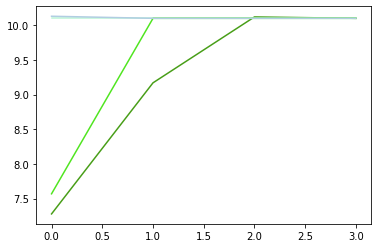

ROUND 3
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302710


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302752
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302711
[(Wrapper)>[PointerTensor | me:9471087454 -> client1:88333695196], (Wrapper)>[PointerTensor | me:30152346770 -> client1:94712697721], (Wrapper)>[PointerTensor | me:49738822513 -> client1:90294642202], (Wrapper)>[PointerTensor | me:96075877488 -> client1:35232289172], (Wrapper)>[PointerTensor | me:7290559445 -> client1:86236551299], (Wrapper)>[PointerTensor | me:66283387150 -> client1:10653794190], (Wrapper)>[PointerTensor | me:57043501164 -> client1:81612511869], (Wrapper)>[PointerTensor | me:72037664091 -> client1:85649018816], (Wrapper)>[PointerTensor | me:5339956057 -> client1:20720042292], (Wrapper)>[PointerTensor | me:97859146619 -> client1:23378310065], (Wrapper)>[PointerTensor | me:90006950214 -> client1:71545100273], (Wrapper)>[PointerTensor | me:21554219700 -> client1:56445930762], (Wrapper)>[PointerTensor | me:57116189636 -> client1:37218778881], (Wrapper)>[Poin

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302576
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302578
[(Wrapper)>[PointerTensor | me:13002928466 -> client10:59226606106], (Wrapper)>[PointerTensor | me:13423625720 -> client10:11343467601], (Wrapper)>[PointerTensor | me:348003292 -> client10:19194682317], (Wrapper)>[PointerTensor | me:80103607947 -> client10:1063705635], (Wrapper)>[PointerTensor | me:2109434195 -> client10:38691234782], (Wrapper)>[PointerTensor | me:43924879203 -> client10:43568559920], (Wrapper)>[PointerTensor | me:21657246474 -> client10:57617242577], (Wrapper)>[PointerTensor | me:56747857915 -> client10:73282063581], (Wrapper)>[PointerTensor | me:84478744042 -> client10:90342636259], (Wrapper)>[PointerTensor | me:30550016669 -> client10:3904825186], (Wrapper)>[PointerTensor | me:3912675709 -> client10:56661780560], (Wrapper)>[PointerTensor | me:56431405327 -> client10:35140466333], (Wrapper)>[PointerTensor | me:81808388156 -> client10:56671198977], (Wr

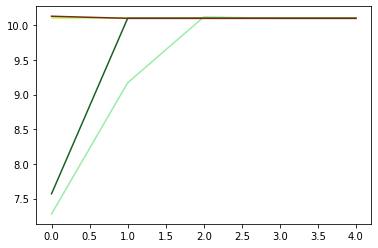

ROUND 4
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302608


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302612
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302608
[(Wrapper)>[PointerTensor | me:92054400971 -> client1:37192749824], (Wrapper)>[PointerTensor | me:59427911048 -> client1:87933329394], (Wrapper)>[PointerTensor | me:39156593154 -> client1:94937027410], (Wrapper)>[PointerTensor | me:90464751868 -> client1:66004746260], (Wrapper)>[PointerTensor | me:7123882741 -> client1:65263052579], (Wrapper)>[PointerTensor | me:38619595517 -> client1:2804038193], (Wrapper)>[PointerTensor | me:37105865368 -> client1:84027113565], (Wrapper)>[PointerTensor | me:87838427188 -> client1:5848467943], (Wrapper)>[PointerTensor | me:56001973596 -> client1:90763178052], (Wrapper)>[PointerTensor | me:49706652034 -> client1:63390087903], (Wrapper)>[PointerTensor | me:82248279531 -> client1:70120189557], (Wrapper)>[PointerTensor | me:49325791190 -> client1:48081062487], (Wrapper)>[PointerTensor | me:41766528689 -> client1:64862873053], (Wrapper)>[Poin

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302584
[(Wrapper)>[PointerTensor | me:12929366390 -> client10:21614892192], (Wrapper)>[PointerTensor | me:18871204675 -> client10:12931785784], (Wrapper)>[PointerTensor | me:68679347288 -> client10:96960265608], (Wrapper)>[PointerTensor | me:15774564042 -> client10:99512627106], (Wrapper)>[PointerTensor | me:80932094150 -> client10:77677308339], (Wrapper)>[PointerTensor | me:75621297563 -> client10:93164445941], (Wrapper)>[PointerTensor | me:65625511716 -> client10:11448612807], (Wrapper)>[PointerTensor | me:1964839166 -> client10:91736031816], (Wrapper)>[PointerTensor | me:92217283749 -> client10:95196376336], (Wrapper)>[PointerTensor | me:44685109654 -> client10:29788269114], (Wrapper)>[PointerTensor | me:98070602822 -> client10:37945190842], (Wrapper)>[PointerTensor | me:91156437338 -> client10:3154015317], (Wrapper)>[PointerTensor | me:4917189229 -> client10:51357788106], 

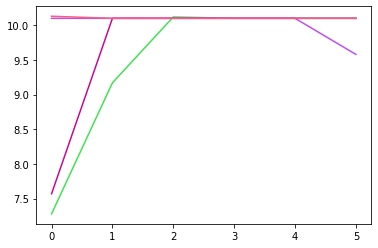

ROUND 5
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302589


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302589
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302590
[(Wrapper)>[PointerTensor | me:5658816826 -> client1:38669184391], (Wrapper)>[PointerTensor | me:65721282543 -> client1:24583007612], (Wrapper)>[PointerTensor | me:3834636519 -> client1:9669622776], (Wrapper)>[PointerTensor | me:30350468373 -> client1:57811407969], (Wrapper)>[PointerTensor | me:47374921138 -> client1:48791011958], (Wrapper)>[PointerTensor | me:46949170865 -> client1:85421060026], (Wrapper)>[PointerTensor | me:22152158377 -> client1:81615401857], (Wrapper)>[PointerTensor | me:29695642667 -> client1:70708039485], (Wrapper)>[PointerTensor | me:30094530614 -> client1:37274666994], (Wrapper)>[PointerTensor | me:23444308381 -> client1:54764834147], (Wrapper)>[PointerTensor | me:48312603979 -> client1:17397670559], (Wrapper)>[PointerTensor | me:32661633861 -> client1:11124388036], (Wrapper)>[PointerTensor | me:96153840393 -> client1:42751768418], (Wrapper)>[Poin

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302585
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302585
[(Wrapper)>[PointerTensor | me:18801260580 -> client10:29826352042], (Wrapper)>[PointerTensor | me:35782367718 -> client10:93808122066], (Wrapper)>[PointerTensor | me:53053207450 -> client10:9814986599], (Wrapper)>[PointerTensor | me:82272921289 -> client10:72232098434], (Wrapper)>[PointerTensor | me:2995818196 -> client10:13724500260], (Wrapper)>[PointerTensor | me:46025257937 -> client10:76685207431], (Wrapper)>[PointerTensor | me:98652255451 -> client10:81302560857], (Wrapper)>[PointerTensor | me:4154590447 -> client10:72242100868], (Wrapper)>[PointerTensor | me:21299640864 -> client10:41108921003], (Wrapper)>[PointerTensor | me:64649412436 -> client10:26111232056], (Wrapper)>[PointerTensor | me:92953861511 -> client10:55169793781], (Wrapper)>[PointerTensor | me:86198519390 -> client10:52441311263], (Wrapper)>[PointerTensor | me:10777545378 -> client10:53983223354], 

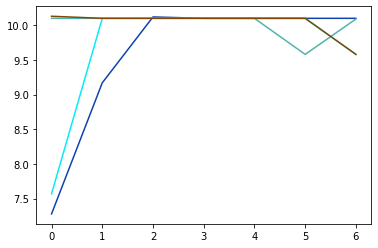

ROUND 6
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302585


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302584
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302585
[(Wrapper)>[PointerTensor | me:20202099288 -> client1:7951344685], (Wrapper)>[PointerTensor | me:5948730781 -> client1:10218609370], (Wrapper)>[PointerTensor | me:69286120029 -> client1:97637817259], (Wrapper)>[PointerTensor | me:24671825452 -> client1:33278681846], (Wrapper)>[PointerTensor | me:97781510158 -> client1:56432863941], (Wrapper)>[PointerTensor | me:98455900194 -> client1:73551962417], (Wrapper)>[PointerTensor | me:17058271736 -> client1:62550258825], (Wrapper)>[PointerTensor | me:73183387484 -> client1:58928430211], (Wrapper)>[PointerTensor | me:18613121686 -> client1:78082637490], (Wrapper)>[PointerTensor | me:38442511821 -> client1:22559797326], (Wrapper)>[PointerTensor | me:62787559607 -> client1:75121020846], (Wrapper)>[PointerTensor | me:82794292142 -> client1:64948625575], (Wrapper)>[PointerTensor | me:27686870688 -> client1:97550606764], (Wrapper)>[Poi

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:87580700823 -> client10:89166397957], (Wrapper)>[PointerTensor | me:5691664333 -> client10:18964891569], (Wrapper)>[PointerTensor | me:16676992787 -> client10:38023907903], (Wrapper)>[PointerTensor | me:74754450627 -> client10:76311893374], (Wrapper)>[PointerTensor | me:61676961565 -> client10:83050134717], (Wrapper)>[PointerTensor | me:30973534328 -> client10:8336874627], (Wrapper)>[PointerTensor | me:12170301919 -> client10:15452570440], (Wrapper)>[PointerTensor | me:25798360259 -> client10:75514080817], (Wrapper)>[PointerTensor | me:38722089274 -> client10:34995375691], (Wrapper)>[PointerTensor | me:7057391546 -> client10:96581361546], (Wrapper)>[PointerTensor | me:68545672139 -> client10:47815779573], (Wrapper)>[PointerTensor | me:61072344074 -> client10:3183362745], (Wrapper)>[PointerTensor | me:94358920609 -> client10:44075258536], (

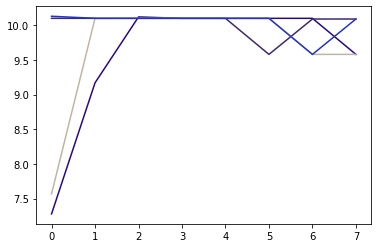

ROUND 7
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302583


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:93312867696 -> client1:68481741230], (Wrapper)>[PointerTensor | me:36620944844 -> client1:24396513140], (Wrapper)>[PointerTensor | me:51237408753 -> client1:58040190690], (Wrapper)>[PointerTensor | me:6444768842 -> client1:60016133243], (Wrapper)>[PointerTensor | me:86611058833 -> client1:93095456813], (Wrapper)>[PointerTensor | me:70253385957 -> client1:20467706757], (Wrapper)>[PointerTensor | me:30182629984 -> client1:21386043955], (Wrapper)>[PointerTensor | me:75127862385 -> client1:9943306683], (Wrapper)>[PointerTensor | me:54590239549 -> client1:33343403897], (Wrapper)>[PointerTensor | me:37982927239 -> client1:10361472732], (Wrapper)>[PointerTensor | me:30890915108 -> client1:20143581667], (Wrapper)>[PointerTensor | me:71582493757 -> client1:35523567282], (Wrapper)>[PointerTensor | me:10754628652 -> client1:92160392667], (Wrapper)>[Poi

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:5436138673 -> client10:98179209577], (Wrapper)>[PointerTensor | me:5729925672 -> client10:47220093130], (Wrapper)>[PointerTensor | me:47777984651 -> client10:5937883304], (Wrapper)>[PointerTensor | me:92624475313 -> client10:87986411663], (Wrapper)>[PointerTensor | me:72099678384 -> client10:64419837947], (Wrapper)>[PointerTensor | me:7289289541 -> client10:1818104061], (Wrapper)>[PointerTensor | me:61245013439 -> client10:11177185821], (Wrapper)>[PointerTensor | me:13982227885 -> client10:74723970165], (Wrapper)>[PointerTensor | me:42557209310 -> client10:63252769179], (Wrapper)>[PointerTensor | me:28639305264 -> client10:84158143722], (Wrapper)>[PointerTensor | me:17501206882 -> client10:43218238831], (Wrapper)>[PointerTensor | me:36681714539 -> client10:68173769237], (Wrapper)>[PointerTensor | me:76283599246 -> client10:22557609515], (W

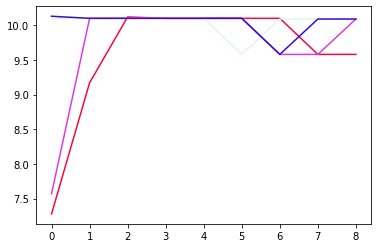

ROUND 8
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302583


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:28079563507 -> client1:72565595890], (Wrapper)>[PointerTensor | me:21159616010 -> client1:10382779015], (Wrapper)>[PointerTensor | me:10693392939 -> client1:88171475041], (Wrapper)>[PointerTensor | me:22594763950 -> client1:4221176634], (Wrapper)>[PointerTensor | me:90593727322 -> client1:96722507702], (Wrapper)>[PointerTensor | me:38210890455 -> client1:47555863842], (Wrapper)>[PointerTensor | me:24282996453 -> client1:17184307692], (Wrapper)>[PointerTensor | me:82833749109 -> client1:93216096091], (Wrapper)>[PointerTensor | me:49447738054 -> client1:88422711270], (Wrapper)>[PointerTensor | me:7121246198 -> client1:99905243203], (Wrapper)>[PointerTensor | me:73353821338 -> client1:64882269719], (Wrapper)>[PointerTensor | me:84784023356 -> client1:83864907155], (Wrapper)>[PointerTensor | me:18125358868 -> client1:48444601289], (Wrapper)>[Poi

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:84461300005 -> client10:62109634817], (Wrapper)>[PointerTensor | me:32436281794 -> client10:58895054369], (Wrapper)>[PointerTensor | me:13601725034 -> client10:68656931562], (Wrapper)>[PointerTensor | me:53041116294 -> client10:29790769331], (Wrapper)>[PointerTensor | me:39602212550 -> client10:38760901454], (Wrapper)>[PointerTensor | me:88343921136 -> client10:86726873986], (Wrapper)>[PointerTensor | me:52633914502 -> client10:58466640927], (Wrapper)>[PointerTensor | me:71648841545 -> client10:52236882040], (Wrapper)>[PointerTensor | me:28515264009 -> client10:87402942244], (Wrapper)>[PointerTensor | me:59280223900 -> client10:48639359238], (Wrapper)>[PointerTensor | me:76257623820 -> client10:11189795406], (Wrapper)>[PointerTensor | me:99992217293 -> client10:18787092796], (Wrapper)>[PointerTensor | me:18143359539 -> client10:75754327856

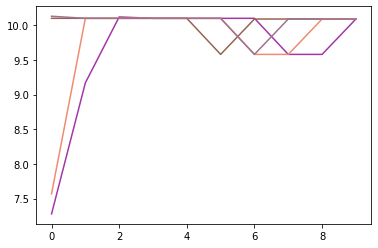

ROUND 9
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302583


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:4725037871 -> client1:63221557132], (Wrapper)>[PointerTensor | me:31692976235 -> client1:13880881867], (Wrapper)>[PointerTensor | me:97079878979 -> client1:69112667489], (Wrapper)>[PointerTensor | me:16179729842 -> client1:48643367433], (Wrapper)>[PointerTensor | me:93010714826 -> client1:73385982830], (Wrapper)>[PointerTensor | me:59868100576 -> client1:28421067106], (Wrapper)>[PointerTensor | me:30098730976 -> client1:83107494369], (Wrapper)>[PointerTensor | me:79235407785 -> client1:63108594956], (Wrapper)>[PointerTensor | me:99428295815 -> client1:23851116600], (Wrapper)>[PointerTensor | me:55616584146 -> client1:27574891405], (Wrapper)>[PointerTensor | me:92173508725 -> client1:99895370361], (Wrapper)>[PointerTensor | me:98427653487 -> client1:83611581045], (Wrapper)>[PointerTensor | me:42858319470 -> client1:56903551212], (Wrapper)>[Po

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:96557768736 -> client10:25167922007], (Wrapper)>[PointerTensor | me:69857122607 -> client10:98819531760], (Wrapper)>[PointerTensor | me:99405636418 -> client10:29434808948], (Wrapper)>[PointerTensor | me:75970993040 -> client10:75676412614], (Wrapper)>[PointerTensor | me:70832831912 -> client10:38674887049], (Wrapper)>[PointerTensor | me:775042790 -> client10:95740869030], (Wrapper)>[PointerTensor | me:40625128956 -> client10:94929437366], (Wrapper)>[PointerTensor | me:50172480483 -> client10:3779005850], (Wrapper)>[PointerTensor | me:91983993862 -> client10:37852189734], (Wrapper)>[PointerTensor | me:11329100848 -> client10:2675891235], (Wrapper)>[PointerTensor | me:4543143733 -> client10:5501896206], (Wrapper)>[PointerTensor | me:23214435665 -> client10:35520523413], (Wrapper)>[PointerTensor | me:13519588462 -> client10:97608436949], (Wr

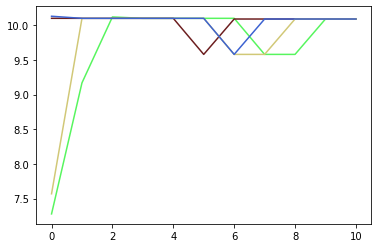

ROUND 10
0.19463999999999093
Power Allocated= 3.291472596684935
CSI= 0.5416479917264309
SNR= 27.64842340394134
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302583


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:66935857936 -> client1:40044009916], (Wrapper)>[PointerTensor | me:79606580929 -> client1:9640161634], (Wrapper)>[PointerTensor | me:55275183921 -> client1:15077221449], (Wrapper)>[PointerTensor | me:56557856723 -> client1:61003493253], (Wrapper)>[PointerTensor | me:99246637314 -> client1:46658275938], (Wrapper)>[PointerTensor | me:2983967527 -> client1:87576967988], (Wrapper)>[PointerTensor | me:30788890635 -> client1:82234177459], (Wrapper)>[PointerTensor | me:80274801665 -> client1:72991934442], (Wrapper)>[PointerTensor | me:11107869656 -> client1:56452173196], (Wrapper)>[PointerTensor | me:17270803127 -> client1:92527397513], (Wrapper)>[PointerTensor | me:55966367009 -> client1:6890874256], (Wrapper)>[PointerTensor | me:15606791808 -> client1:8231139003], (Wrapper)>[PointerTensor | me:17634178498 -> client1:39831693469], (Wrapper)>[Point

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302583
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.302583
[(Wrapper)>[PointerTensor | me:19012884960 -> client10:35098500252], (Wrapper)>[PointerTensor | me:64497174060 -> client10:50106271152], (Wrapper)>[PointerTensor | me:59177280044 -> client10:73853627894], (Wrapper)>[PointerTensor | me:90573340167 -> client10:84145946598], (Wrapper)>[PointerTensor | me:53544254885 -> client10:45210414419], (Wrapper)>[PointerTensor | me:3165849505 -> client10:9027857167], (Wrapper)>[PointerTensor | me:66900926359 -> client10:68754264547], (Wrapper)>[PointerTensor | me:68648405330 -> client10:56965195442], (Wrapper)>[PointerTensor | me:14495253860 -> client10:91052495607], (Wrapper)>[PointerTensor | me:16459729775 -> client10:99936360427], (Wrapper)>[PointerTensor | me:53402462728 -> client10:74365266383], (Wrapper)>[PointerTensor | me:5385080873 -> client10:44380558196], (Wrapper)>[PointerTensor | me:72291890835 -> client10:27310545277], 

In [ ]:
for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)

final_acc=[]
final_loss=[]
    
for fed_round in range(args.rounds):
    overall=Net()
    if(fed_round==0): #fed_round==0
        arranged_clusters,head_snr_list=cluster_former(args.numclusters,args.clients)
        temp=deepcopy(arranged_clusters)
        temp2=deepcopy(head_snr_list)
    else:
        #print(temp)
        arranged_clusters=deepcopy(temp)
        head_snr_list=deepcopy(temp2)
#     print(arranged_clusters)
    
    no=1
    heads_list=[]
    weights=[]
    weight_head_list=[]
    head_acc=[]
    head_loss=[]
    for cluster in arranged_clusters:
        
        head=cluster['Cluster Head']
        members=cluster['Members']
        snrs=cluster['SNR']
        csis=cluster['CSI']
        weights.append(sum(snrs))
        weight_head_list.append([head,sum(snrs)])
        new_members=[]
        
        for ij in members:
        #print(ij)
            cl_no=int(ij[6:])
            new_members.append(clients[cl_no-1])
#         print(head)
        head=clients[int(head[6:])-1]
        cluster['Members']=new_members
#         print(head)

        smallmu1=0
        gsmall1=3.402823466E+38 
        
        #water filling algorithm
        mu=1e-15
        while(mu<=1):
            g1=0
            pn1=0
            for jj in csis:
                pn=max(1/mu-1/jj,0)
                g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
                pn1+=pn
            g=g1-mu*(pn1-P*30)
            if(g<gsmall1):
                smallmu1=mu
                gsmall1=g
            mu+=0.00002
        
        print(smallmu1)
        good_mem=[]
#         print(len(snrs))
#         print(len(csis))
#         print(len(new_members))
        index=0
        for client in new_members:
            goodchannel=ClientUpdate(args, device, client,key_np,key,snrs[index],csis[index],smallmu1,head)
            index+=1
            if(goodchannel):
                good_mem.append(client)
        
        head['model']=averageModels(head['model'], good_mem)
        arr=test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)
        ac=arr[0]#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[0]
        no+=1
        heads_list.append(head)
        head_acc.append(ac)
        head_loss.append(arr[1])#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[1])
    
    final_acc.append(head_acc)
    final_loss.append(head_loss)
    fig,ax=plt.subplots()
    clor = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(args.numclusters)]
    #ax.plot([i for i in range(fed_round)],head_acc[0])
    for jj in range(0,args.numclusters):
        
        ax.plot([i for i in range(len(final_acc))],[final_acc[j][jj] for j in range(len(final_acc))], color = clor[jj])
        
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][0] for j in range(len(final_acc))], color ="red")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][1] for j in range(len(final_acc))],color ="blue")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][2] for j in range(len(final_acc))],color ="green")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][3] for j in range(len(final_acc))],color ="black")
    #ax.plot([i for i in range(len(final_acc))],head_acc[1], fed_round, color ="blue")
    #ax.plot([i for i in range(len(final_acc))],head_acc[2], fed_round, color ="green")
    #ax.plot([i for i in range(len(final_acc))],head_acc[3], fed_round, color ="black")
    
    
    plt.show()
    weightsum=sum(weights)
    
    weights[:] = [x / weightsum for x in weights]
    for aah in range(len(weight_head_list)):
        weight_head_list[aah][1]=weights[aah]
    final_heads,nets=decentralized(heads_list,head_snr_list,weight_head_list)
    
    for head in range(len(final_heads)):
        for cluster in arranged_clusters:
            head1=cluster['Cluster Head']
            if(head1==final_heads[head]['hook'].id):
                for mem in cluster['Members']:
                    mem['model'].load_state_dict(nets[head].state_dict())
    print("ROUND",fed_round)

In [ ]:
print(final_acc)